In [72]:
%matplotlib inline
from __future__ import division
import numpy as np
import matplotlib.pyplot as plt
import cv2
from glob import glob

def chunks(l, n):
    """ Yield successive n-sized chunks from l.
        from http://goo.gl/DZNhk
    """
    for i in xrange(0, len(l), n):
        yield l[i:i+n]


In [2]:
cat_image = cv2.imread('../images/kitty-cat.jpg')

aspect = cat_image.shape[0]/cat_image.shape[1]


cat_image = cv2.resize(cat_image, dsize=(512, int(np.round(aspect*512))), interpolation=cv2.INTER_LANCZOS4)
print cat_image.shape[0]/cat_image.shape[1]
print cat_image.shape[0], cat_image.shape[1]

cv2.imwrite('../images/kitty-cat-resized.png', cat_image)


def rgb(im):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

0.75
384 512


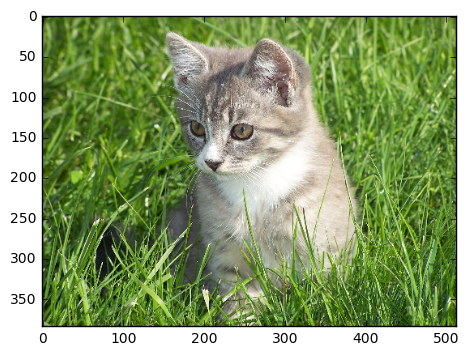

In [3]:
plt.imshow(rgb(cat_image))
#destRGB = cv2.cvtColor(srcBGR, cv2.COLOR_BGR2RGB)

In [4]:
cv2.imwrite('../images/compression_examples/original.png', cat_image)
for qf in [1, 5, 10, 20, 60, 80, 100]:
    cv2.imwrite('../images/compression_examples/qf{}.jpg'.format(qf), cat_image, (cv2.IMWRITE_JPEG_QUALITY, qf))

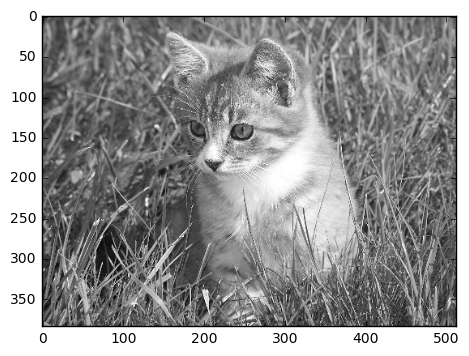

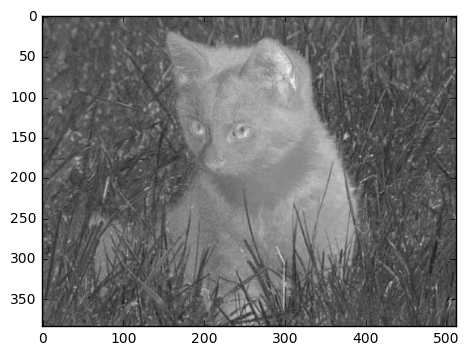

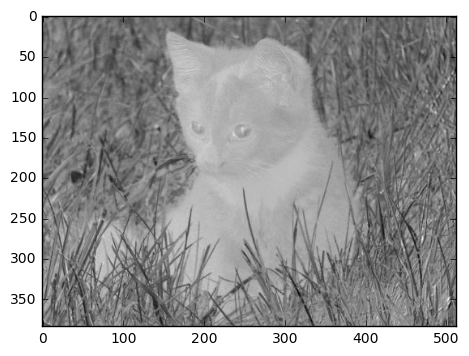

In [5]:
ycrcb_cat = cv2.cvtColor(cat_image, cv2.COLOR_BGR2YCrCb)
plt.imshow(ycrcb_cat[:,:,0], cmap='gray')
plt.show()
plt.imshow(ycrcb_cat[:,:,1], cmap='gray')
plt.show()
plt.imshow(ycrcb_cat[:,:,2], cmap='gray')
plt.show()

cv2.imwrite('../images/compression_examples/ycrcb_0.png', ycrcb_cat[:,:,0])
cv2.imwrite('../images/compression_examples/ycrcb_1.png', ycrcb_cat[:,:,1])
cv2.imwrite('../images/compression_examples/ycrcb_2.png', ycrcb_cat[:,:,2])


copycat = np.zeros_like(ycrcb_cat)
#copycat[:,:,1] = ycrcb_cat[:,:,1]
copycat[:,:,0] = ycrcb_cat[:,:,0]
copycat = cv2.cvtColor(copycat, cv2.COLOR_YCrCb2BGR)


In [6]:
_a, compresso = cv2.imencode('.jpg', cat_image, (cv2.IMWRITE_JPEG_QUALITY, 100))

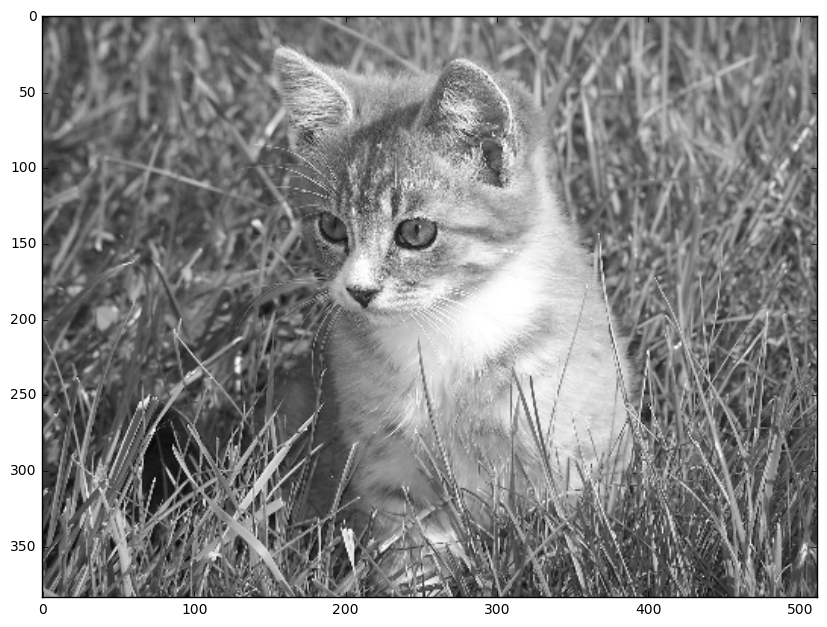

In [7]:
cat_new = cv2.imdecode(compresso, 0)
plt.figure(figsize=(10,10))
plt.imshow(cat_new, cmap='gray')

1338


1338
-5.5171e-05


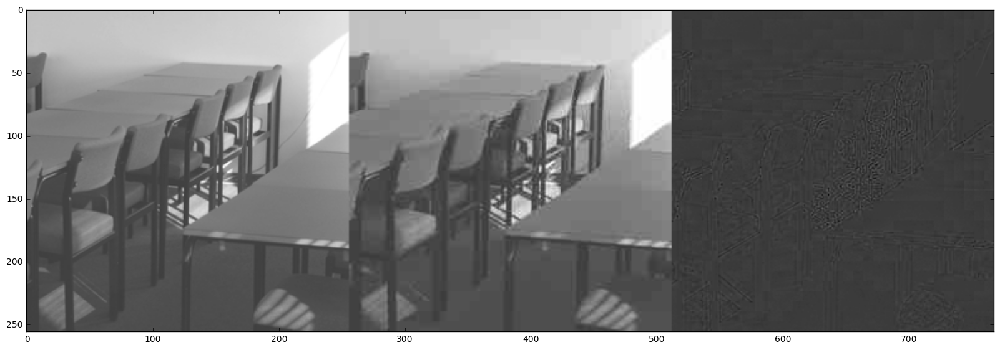

In [93]:
from tqdm import tqdm

input_files = glob('../data/ucid/*.tif')
np.random.seed(1)
print len(input_files)
np.random.shuffle(input_files)


def random_crop(image, crop_size=256):
    r_x = np.random.randint(image.shape[0]-crop_size)
    r_y = np.random.randint(image.shape[1]-crop_size)
    
    image = image[r_x:r_x+crop_size, r_y:r_y+crop_size]
    
    return image

def image_sample(filepath):
    image = cv2.imread(filepath, 0) #Read as grayscale
    image = random_crop(image)
    
    _, compresso = cv2.imencode('.jpg', image, (cv2.IMWRITE_JPEG_QUALITY, 20))
    compressed_image = cv2.imdecode(compresso, 0)
    
    image = (image.astype(np.float32)/255.)
    compressed_image = (compressed_image.astype(np.float32)/255.)
    
    return np.expand_dims(image, axis=0), np.expand_dims(compressed_image, axis=0)


def get_image_generator(filenames, batch_size=32):
    
    #samples_per_epoch = np.ceil(len(filenames)/batch_size)
    samples_per_epoch = len(filenames)
    filenames = list(filenames)
    def genny():
        while True:
            
            np.random.shuffle(filenames)
        
            filename_batches = chunks(filenames, batch_size)
        
            for fb in filename_batches:
                original, compressed = zip(* map(image_sample, fb))
                original = np.array(original, dtype=np.float32)
                compressed = np.array(compressed, dtype=np.float32)
                
                yield compressed, original
    
    return genny(), samples_per_epoch
            
im, com = image_sample(input_files[0])
res = com-im



plt.figure(figsize=(20,10))
plt.imshow(np.hstack((im[0],com[0],res[0])), cmap='gray')
print np.mean(res[0])

In [94]:
from keras.models import Model
from keras.layers import Input, merge, Convolution2D, MaxPooling2D, UpSampling2D
from keras.optimizers import Adam, SGD
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as K
K.set_image_dim_ordering('th')

In [95]:
img_rows = 256 #384
img_cols = 256 #512

def get_unet():
    inputs = Input((1, img_rows, img_cols))
    conv1 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(inputs)
    conv1 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(pool1)
    conv2 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(pool2)
    conv3 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(pool3)
    conv4 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(conv4)
    #pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    #conv5 = Convolution2D(512, 3, 3, activation='relu', border_mode='same')(pool4)
    #conv5 = Convolution2D(512, 3, 3, activation='relu', border_mode='same')(conv5)

    #up6 = merge([UpSampling2D(size=(2, 2))(conv5), conv4], mode='concat', concat_axis=1)
    #conv6 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(up6)
    conv6 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(conv4)
    conv6 = Convolution2D(256, 3, 3, activation='relu', border_mode='same')(conv6)

    #up7 = merge([UpSampling2D(size=(2, 2))(conv6), conv3], mode='concat', concat_axis=1)
    up7 = merge([UpSampling2D(size=(2, 2))(conv6), conv3], mode='concat', concat_axis=1)
    conv7 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(up7)
    conv7 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(conv7)

    up8 = merge([UpSampling2D(size=(2, 2))(conv7), conv2], mode='concat', concat_axis=1)
    conv8 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(up8)
    conv8 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv8)

    up9 = merge([UpSampling2D(size=(2, 2))(conv8), conv1], mode='concat', concat_axis=1)
    conv9 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(up9)
    conv9 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(conv9)

    conv10 = Convolution2D(1, 1, 1, activation='sigmoid')(conv9)

    model = Model(input=inputs, output=conv10)

    model.compile(optimizer=Adam(lr=2e-5), loss='mean_squared_error', metrics=['mean_squared_error'])

    return model

def simplenet():
    inputs = Input((1, img_rows, img_cols))
    conv1 = Convolution2D(32, 3, 3, activation='relu', border_mode='same')(inputs)
    conv2 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv1)
    conv4 = Convolution2D(64, 3, 3, activation='relu', border_mode='same')(conv2)
    conv5 = Convolution2D(128, 3, 3, activation='relu', border_mode='same')(conv4)
    conv6 = Convolution2D(1, 1, 1, activation='sigmoid')(conv5)
    
    model = Model(input=inputs, output=conv6)
    
    model.compile(optimizer=Adam(lr=2e-5), loss='mean_squared_error', metrics=['mean_squared_error'])
    
    return model

def ar_cnn():
    inputs = Input((1, img_rows, img_cols))
    conv1 = Convolution2D(64, 9, 9, activation='relu', border_mode='same')(inputs)
    conv2 = Convolution2D(32, 7, 7, activation='relu', border_mode='same')(conv1)
    conv3 = Convolution2D(16, 1, 1, activation='relu', border_mode='same')(conv2)
    conv4 = Convolution2D(1, 5, 5, activation=None, border_mode='same')(conv3)
    
    model = Model(input=inputs, output=conv4)
    
    model.compile(optimizer=SGD(lr=0.0001), loss='mean_squared_error', metrics=['mean_squared_error', PSNRLoss])
    
    return model


def PSNRLoss(y_true, y_pred):
    """
    PSNR is Peek Signal to Noise Ratio, which is similar to mean squared error.
    It can be calculated as
    PSNR = 20 * log10(MAXp) - 10 * log10(MSE)
    When providing an unscaled input, MAXp = 255. Therefore 20 * log10(255)== 48.1308036087.
    However, since we are scaling our input, MAXp = 1. Therefore 20 * log10(1) = 0.
    Thus we remove that component completely and only compute the remaining MSE component.
    """
    return -10. * np.log10(K.mean(K.square(y_pred - y_true)))


def psnr(y_true, y_pred):
    assert y_true.shape == y_pred.shape, "Cannot calculate PSNR. Input shapes not same." \
                                         " y_true shape = %s, y_pred shape = %s" % (str(y_true.shape),
                                                                                   str(y_pred.shape))
        
    return -10. * np.log10(np.mean(np.square(y_pred - y_true)))



In [96]:
model = ar_cnn()
model_checkpoint = ModelCheckpoint('ar_cnn.hdf5', monitor='loss', save_best_only=True)

train_generator, train_samples_per_epoch = get_image_generator(input_files[:1000])
val_generator, val_samples_per_epoch = get_image_generator(input_files[1000:])

x = next(train_generator)
print train_samples_per_epoch
print val_samples_per_epoch

model.fit_generator(train_generator, train_samples_per_epoch*5, 
                    nb_epoch=5000, 
                    verbose=1, 
                    validation_data=val_generator,
                    nb_val_samples=val_samples_per_epoch*5,
callbacks=[model_checkpoint])

1000
338
Epoch 1/5000
5000/5000 [==============================] - 135s - loss: 0.2045 - mean_squared_error: 0.2045 - PSNRLoss: 6.9520 - val_loss: 0.1623 - val_mean_squared_error: 0.1623 - val_PSNRLoss: 7.9063
Epoch 2/5000
5000/5000 [==============================] - 135s - loss: 0.1321 - mean_squared_error: 0.1321 - PSNRLoss: 8.8474 - val_loss: 0.1006 - val_mean_squared_error: 0.1006 - val_PSNRLoss: 9.9857
Epoch 3/5000
5000/5000 [==============================] - 136s - loss: 0.0767 - mean_squared_error: 0.0767 - PSNRLoss: 11.2299 - val_loss: 0.0551 - val_mean_squared_error: 0.0551 - val_PSNRLoss: 12.5983
Epoch 4/5000
5000/5000 [==============================] - 135s - loss: 0.0409 - mean_squared_error: 0.0409 - PSNRLoss: 13.9651 - val_loss: 0.0302 - val_mean_squared_error: 0.0302 - val_PSNRLoss: 15.2203
Epoch 5/5000
5000/5000 [==============================] - 136s - loss: 0.0240 - mean_squared_error: 0.0240 - PSNRLoss: 16.2361 - val_loss: 0.0206 - val_mean_squared_error: 0.0206 - va

KeyboardInterrupt: 

In [97]:
model = ar_cnn()
#model.load_weights('unet.hdf5')
model.load_weights('ar_cnn.hdf5')

val_generator, val_samples_per_epoch = get_image_generator(input_files[1000:])

batch = next(val_generator)
x_images = batch[0]
y_target = batch[1]


y_pred = model.predict(x_images)

2262.39 3152.83 890.441


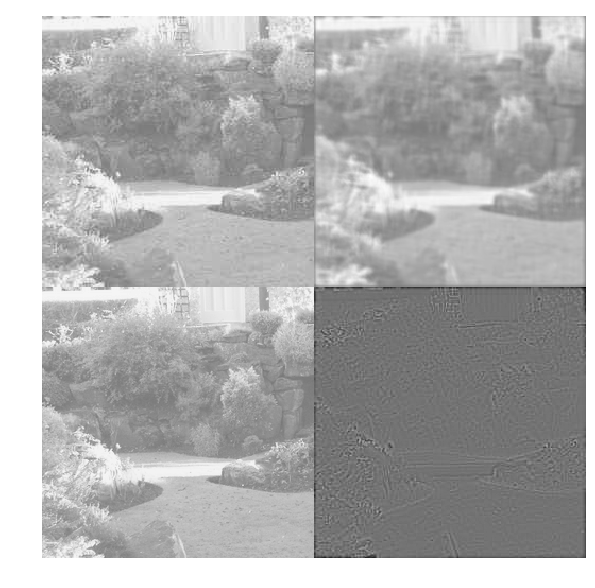

3203.21 11709.4 8506.17


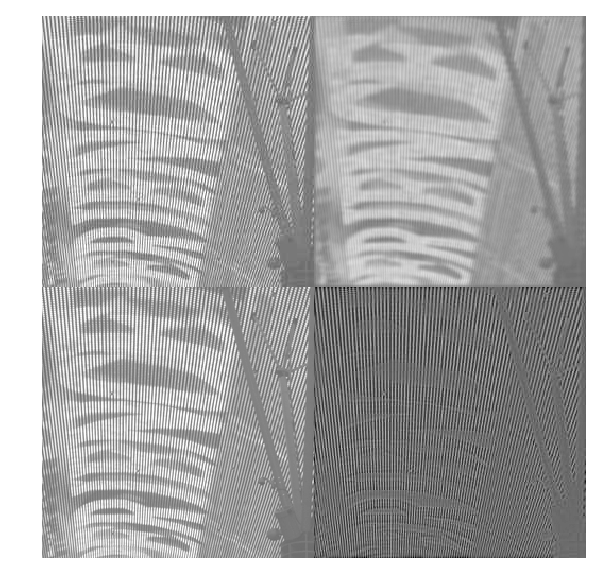

766.212 1300.8 534.59


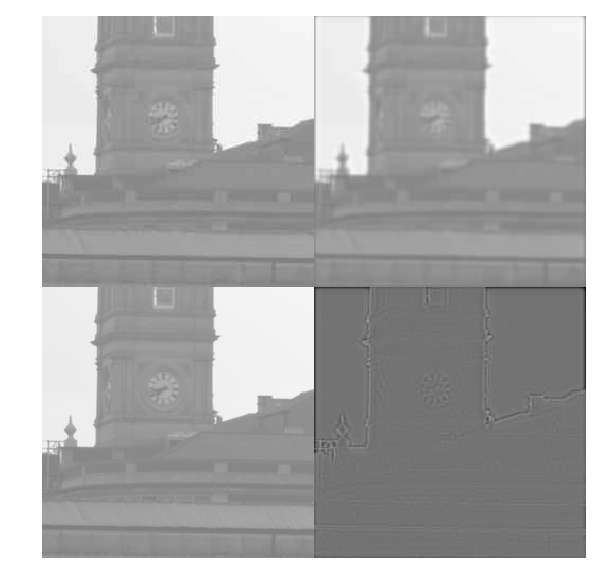

1451.0 2049.03 598.031


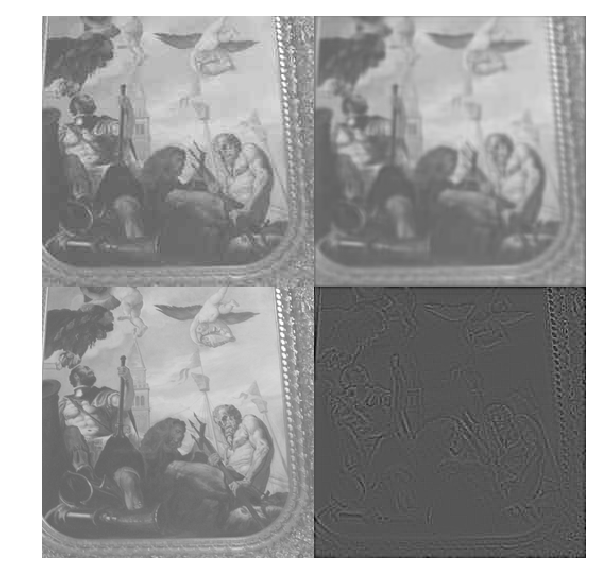

1371.45 2149.41 777.956


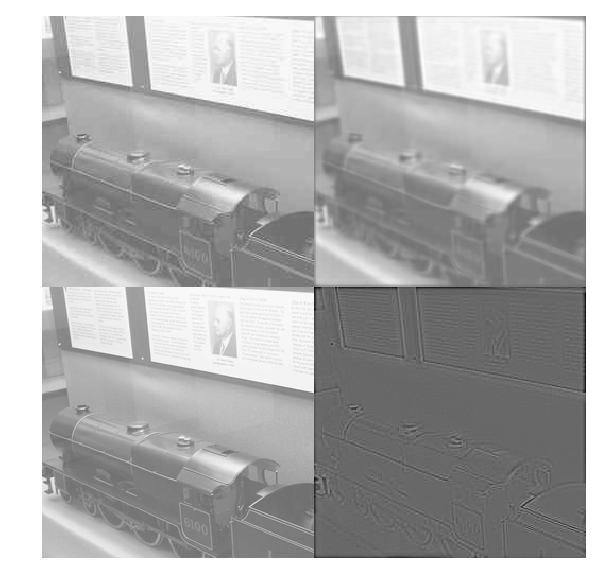

1378.26 2723.3 1345.04


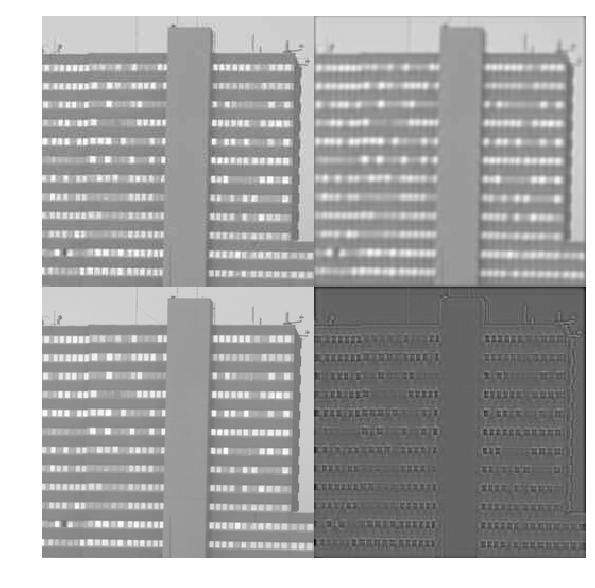

1312.68 2057.35 744.67


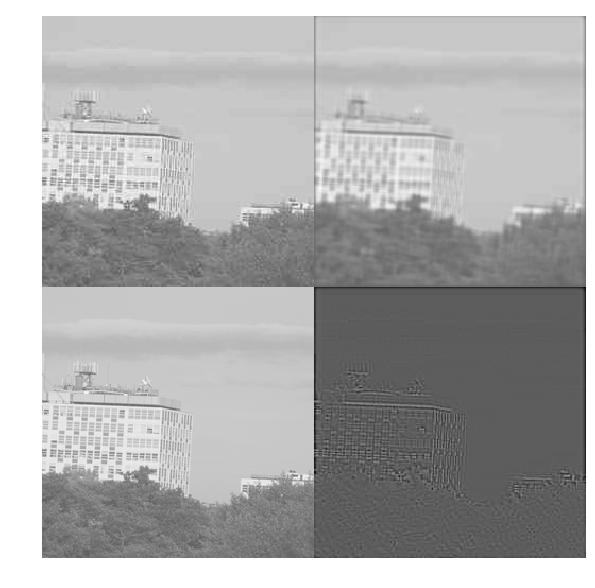

1196.57 2425.89 1229.32


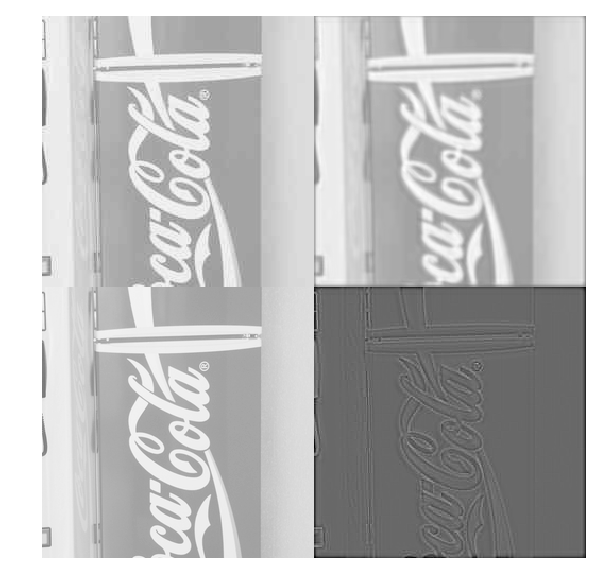

1214.11 2123.89 909.783


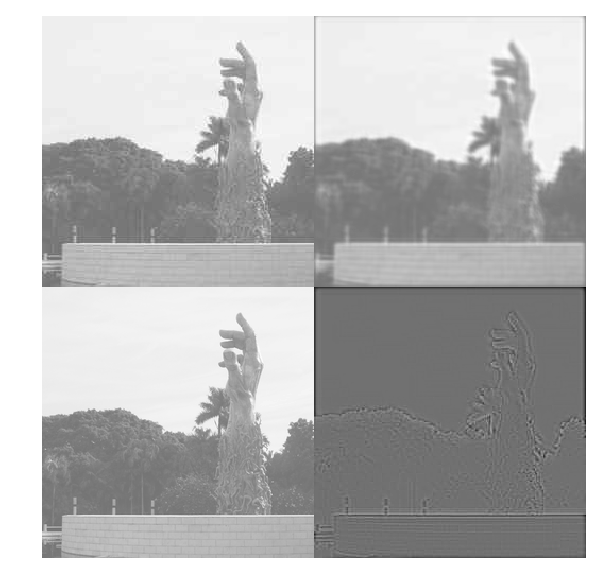

1007.09 1623.67 616.583


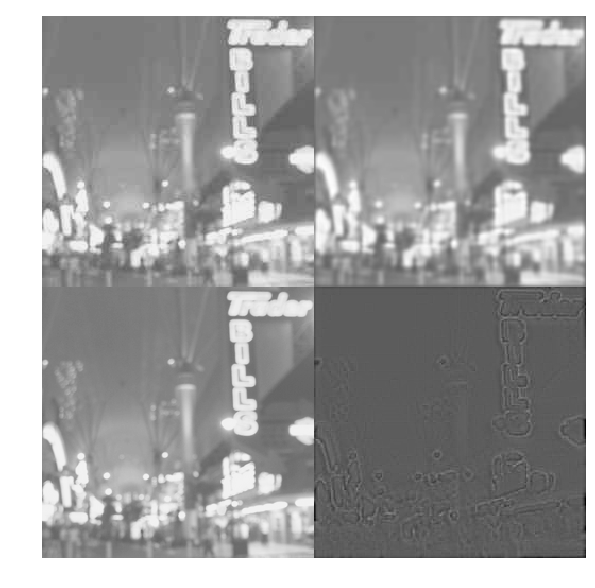

1615.96 2923.06 1307.1


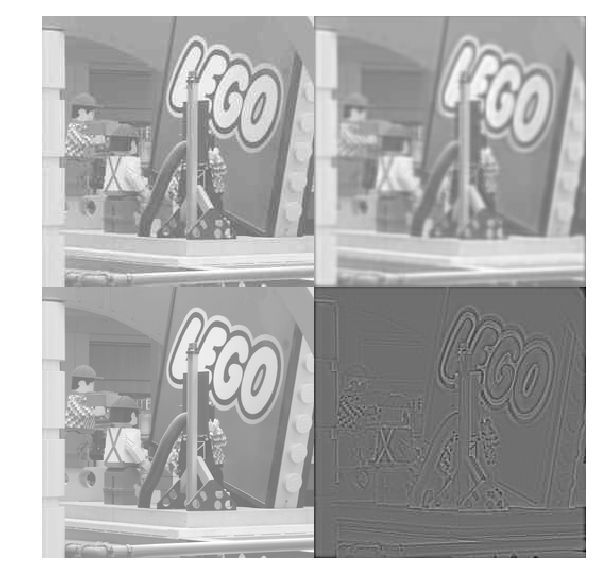

1429.17 1977.69 548.521


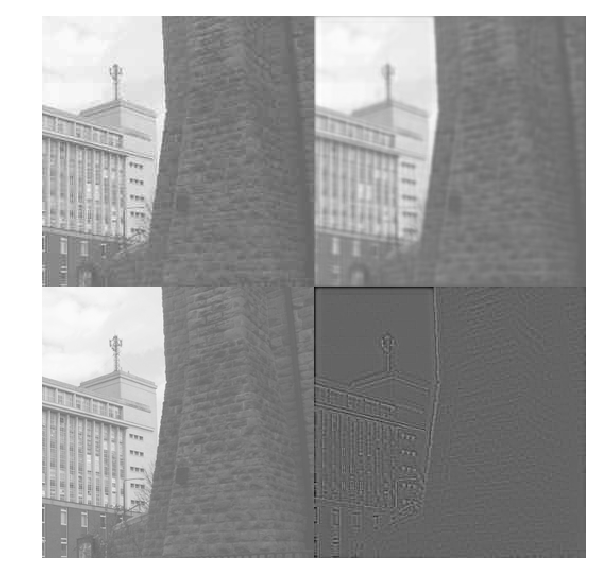

1503.81 2143.93 640.12


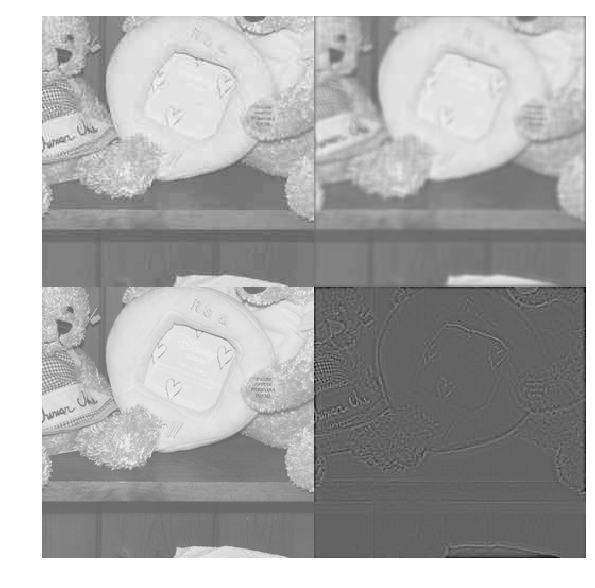

3348.76 9642.27 6293.51


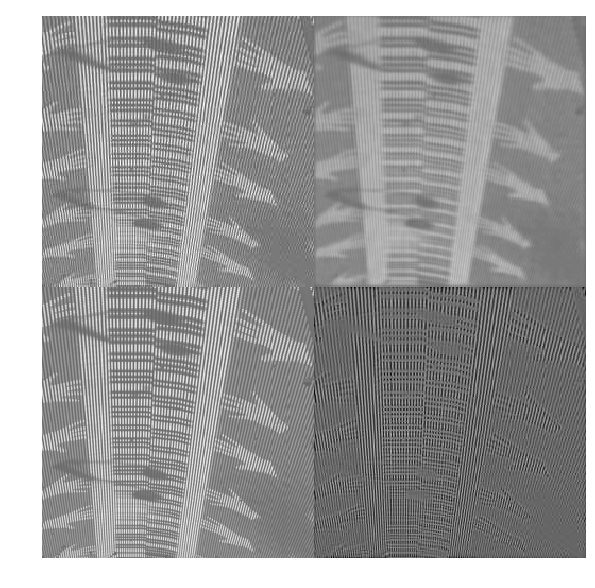

1749.63 2375.89 626.262


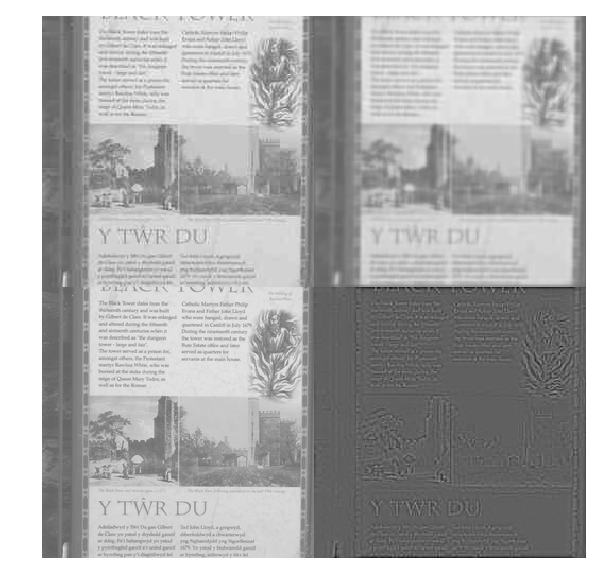

1187.6 2137.55 949.958


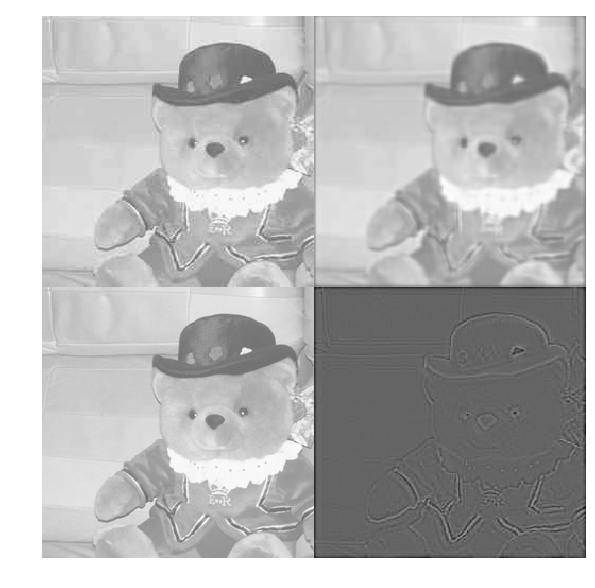

4726.88 9592.22 4865.34


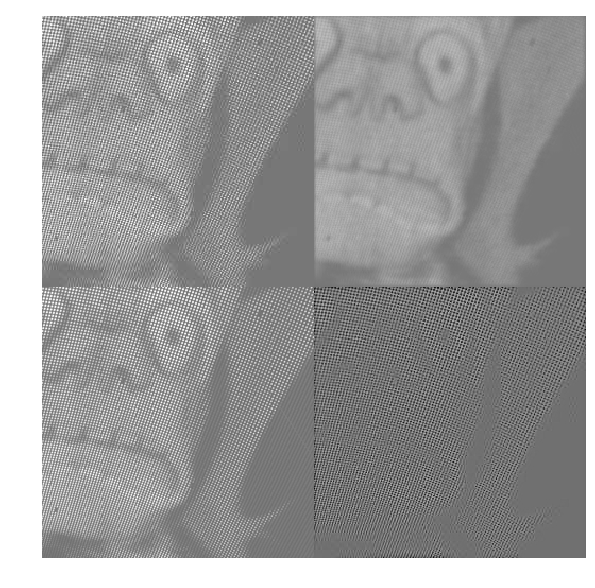

595.337 964.456 369.119


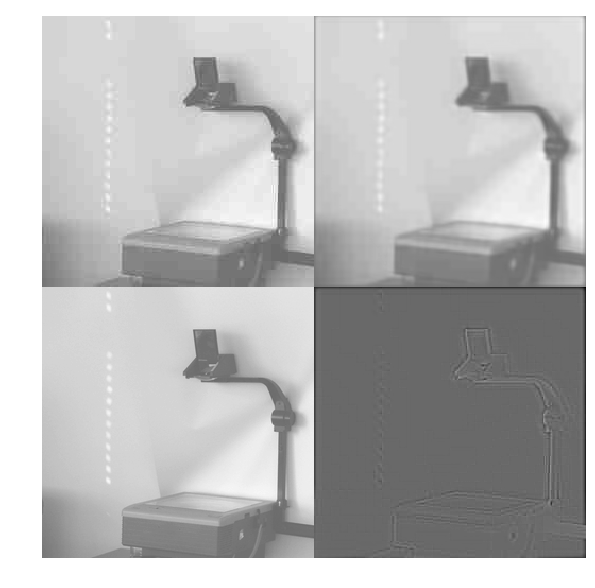

1261.64 2159.5 897.868


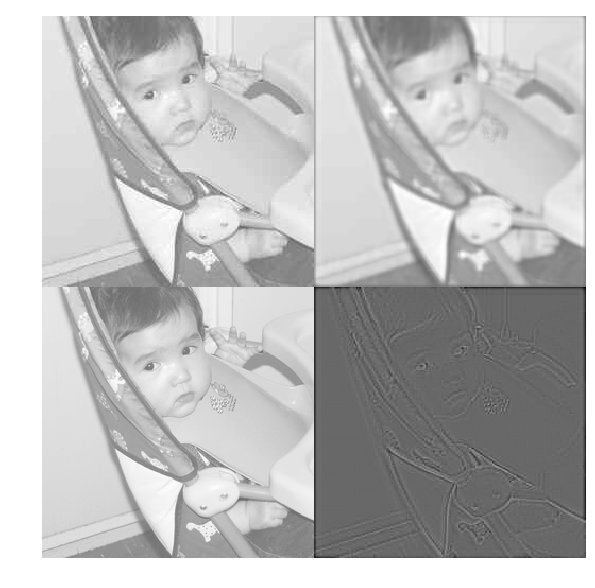

1230.32 1679.63 449.314


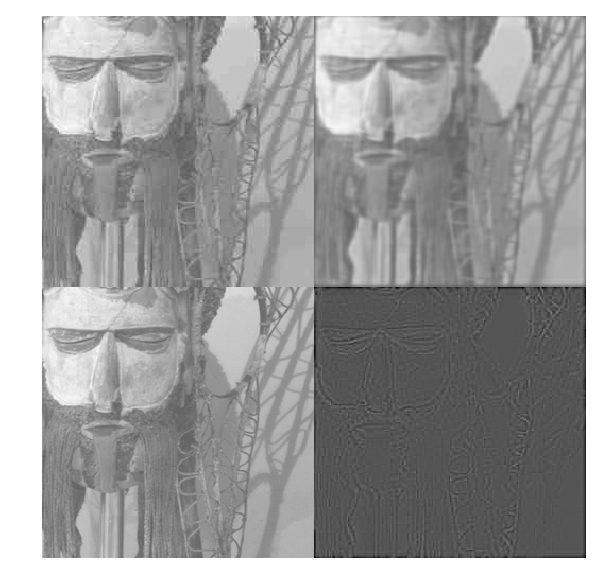

1544.37 2745.92 1201.55


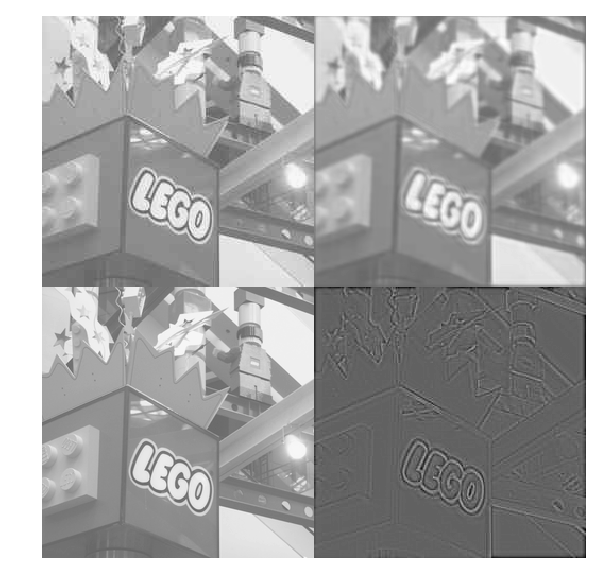

1865.67 3185.14 1319.47


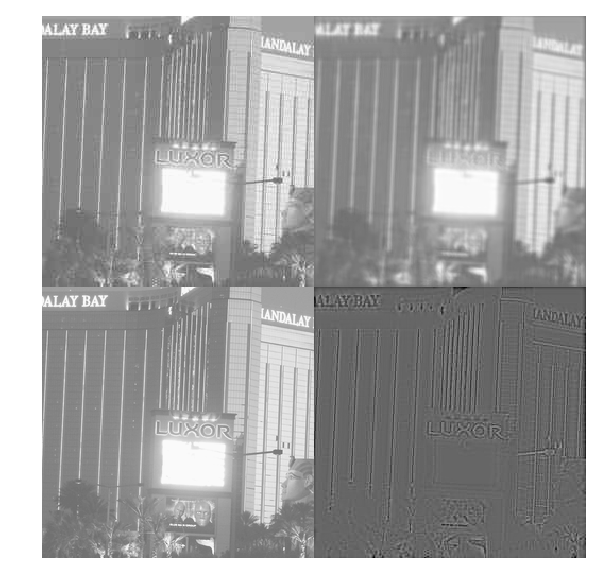

1441.21 2528.74 1087.53


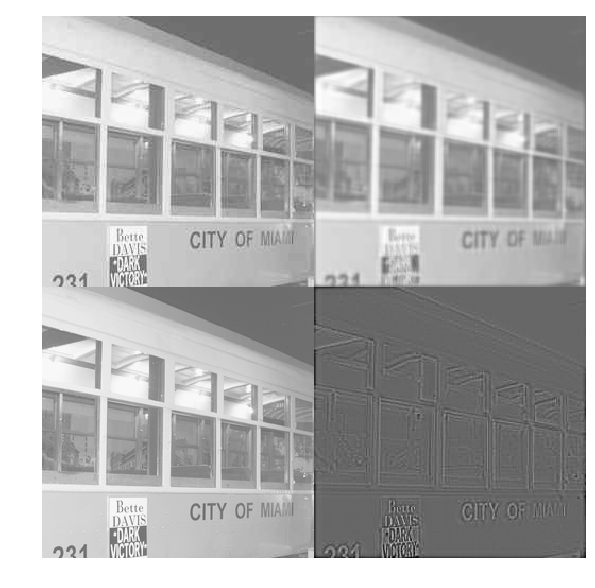

1765.83 2696.83 931.002


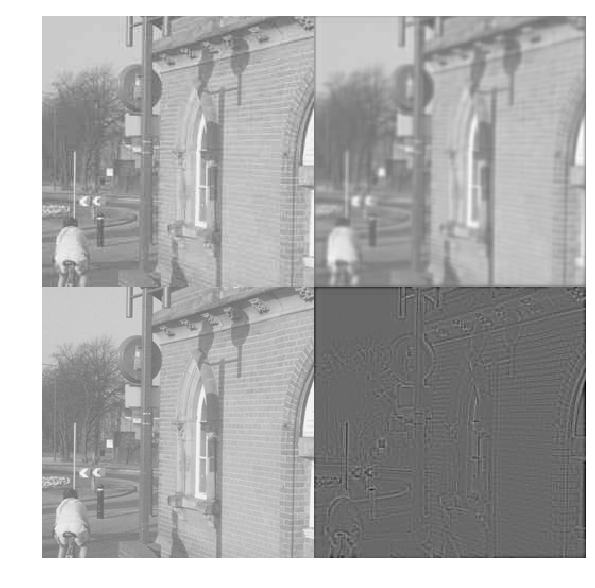

1024.81 1845.53 820.726


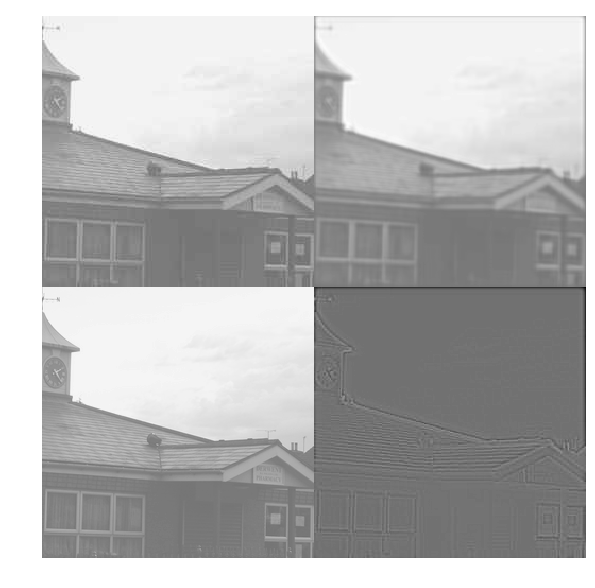

1724.27 3829.07 2104.8


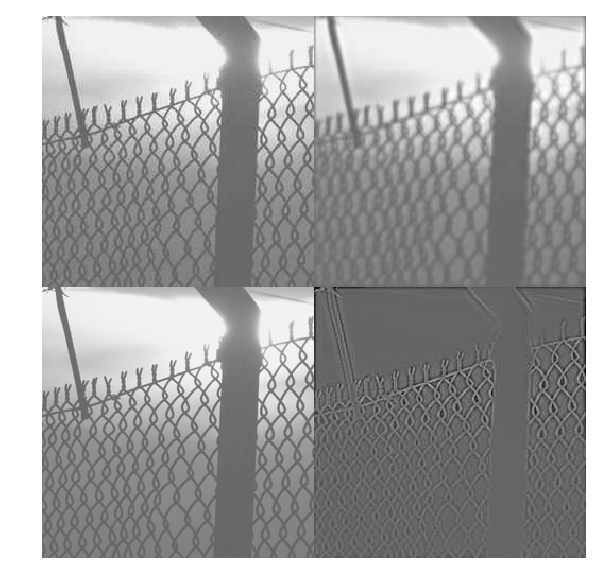

1657.4 2494.47 837.072


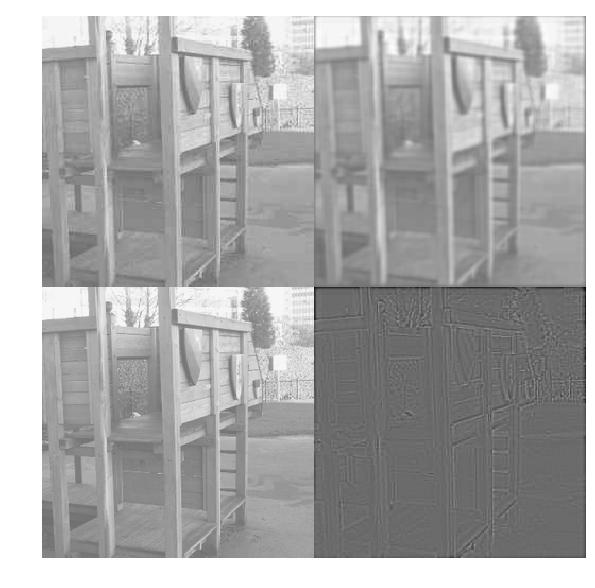

1554.07 2300.79 746.719


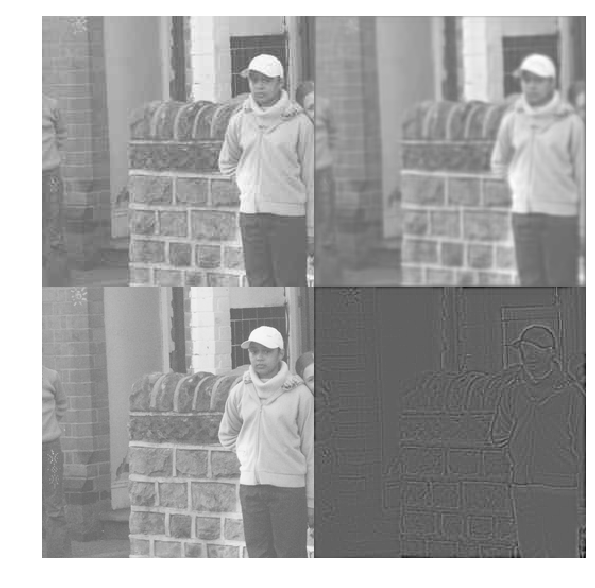

2489.92 6072.63 3582.71


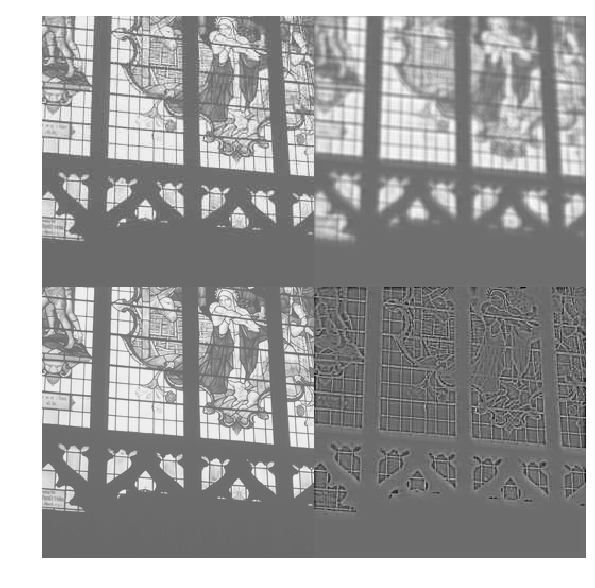

1492.51 2597.58 1105.07


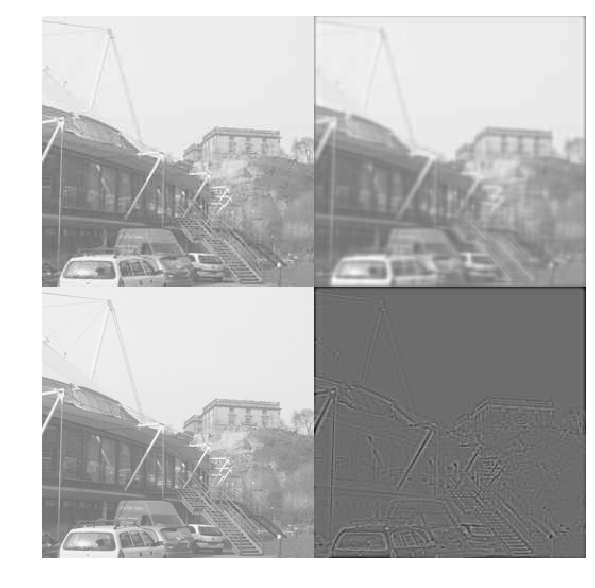

2162.95 3500.55 1337.6


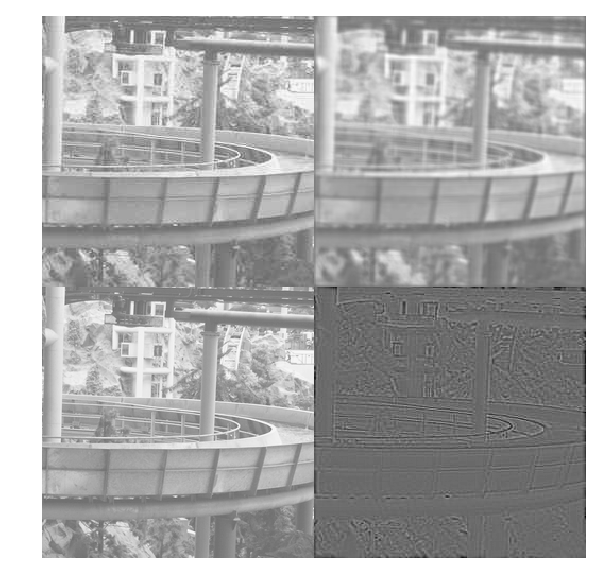

1617.82 2709.87 1092.05


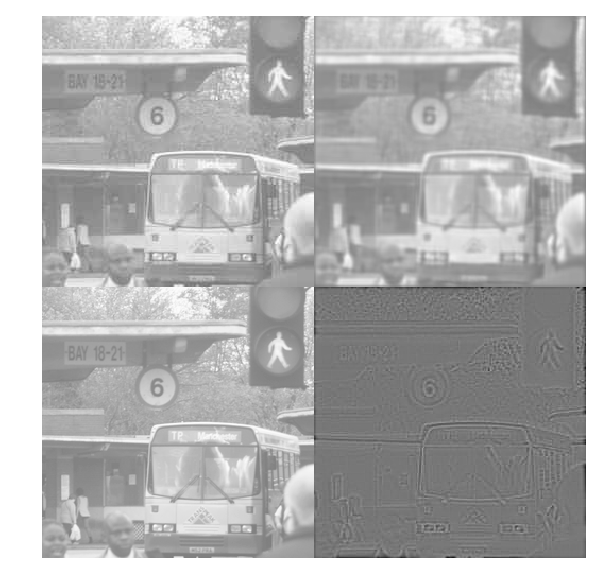

In [98]:
for pred, target, orig in zip(y_pred, y_target, x_images):
    
    #print np.mean(orig), np.mean(pred), np.mean(target)
    #print np.min(orig), np.min(pred), np.min(target)
    
    print np.abs(target-orig).sum(), np.abs(target-pred).sum(), np.abs(target-pred).sum()-np.abs(target-orig).sum()
    
    plt.figure(figsize=(10,7))
    plt.axis('off')
    
    plot_img = np.vstack((  np.hstack((orig[0],pred[0])), np.hstack((target[0],pred[0]-orig[0])) ))*255
    
    plt.imshow(plot_img, interpolation='nearest', cmap='gray')
    plt.show()
    